In [1]:
import sys

import torch
import torch.nn.functional as F
import numpy as np

import lib.midi as midi
import lib.audio as audio
import lib.util as util

from scipy.io import wavfile

import matplotlib.pyplot as plt
from IPython.display import Audio

import pyximport
pyximport.install(reload_support=True, language_level=sys.version_info[0])
import lib.align as align

### Load an example audio performance and labels

In [2]:
file = '000_bwv863p'                                    # an example performance
notes,_ = midi.load_midi('perf/' + file + '.midi')      # symbolic ground truth midi labels 
fs, wav = wavfile.read('perf/' + file + '.wav')         # audio performance (real-valued 44.1kHz audio wave)
wav = wav.sum(1)                                        # sum the stereo channels (mono)
out = audio.mark_notes(wav, [fs*n[1] for n in notes],\
                            [[n[0]] for n in notes])    # crude sine-wave synthesis of the midi labels
Audio((out+wav)[:30*fs],rate=fs)                        # play the performance with superimposed synthesized labels

### Load the score for the corresponding audio performance

In [3]:
score,_ = midi.load_midi('score/' + util.map_score(file) + '.midi')   # symbolic midi score
out = audio.mark_notes(wav, [fs*n[1] for n in score],\
                            [[n[0]] for n in score])                  # crude sine-wave synthesized performance
Audio(out[:30*fs],rate=fs)                                            # play the synthesized score

# score to midi alignment (symbolic alignment)

In [4]:
perf_events = midi.load_midi_events('perf/' + file + '.midi')                   # symbolic run-length encoded labels
score_events = midi.load_midi_events('score/' + util.map_score(file) + '.midi') # symbolic run-length encoded score

score_rep = score_events[:,:128].astype(np.float32)
perf_rep = perf_events[:,:128].astype(np.float32)
perf_timing = perf_events[:,-1].astype(np.float32)

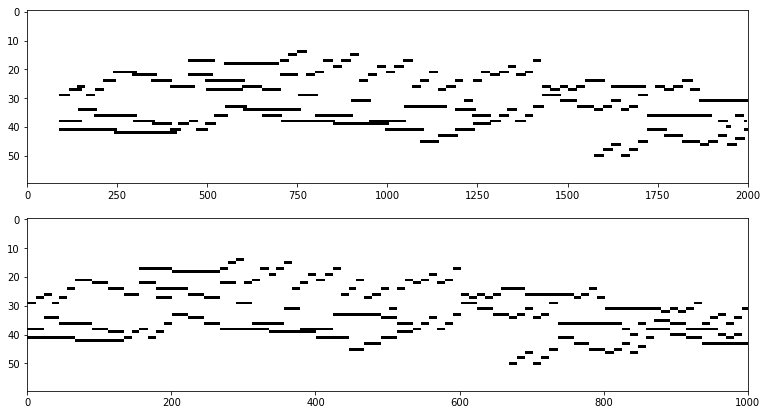

In [5]:
fig, ax = plt.subplots(2,figsize=(14,7))
util.plot_events(ax[0],perf_events)
util.plot_events(ax[1],score_events,num_windows=1000)

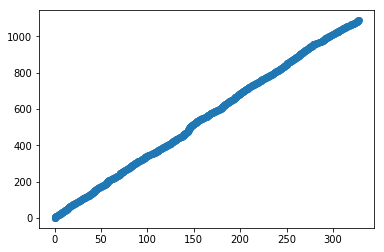

In [6]:
L = align.align(score_rep,perf_rep,weights=perf_timing)         # alignment cost matrix weighted by performance timing
path,costs = align.traceback(score_rep,perf_rep,L,perf_timing)  # recover the optimal path via back-tracing
plt.scatter(*zip(*path));

102.03385416666666 45.512897658333536


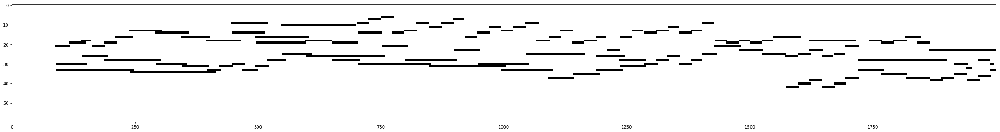

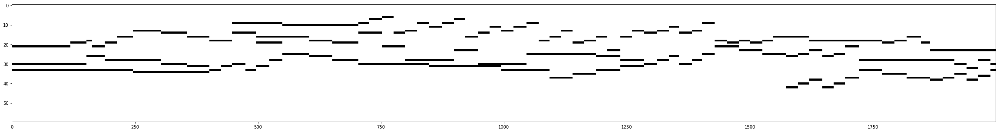

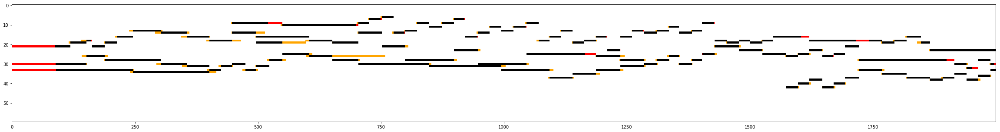

In [7]:
# question: does this alignment assume that p[1] increments uniformly +1? is this correct?
# print([p[1] for p in path])
alignment = np.array([np.sum(score_events[:,-1][:p[0]]) for p in path])
util.plot_perf_alignment(perf_events, score_events, alignment, num_windows=2000)

# score to audio alignment (acoustic alignment)

In [8]:
stride = 512
wsin,wcos = audio.create_filters(2048)
wav = torch.Tensor(wav)

spectrum = F.conv1d(wav[None,None,:], wsin[:,None,:], stride=stride)**2 \
         + F.conv1d(wav[None,None,:], wcos[:,None,:], stride=stride)**2
    
# crude alignment of spectrogram buckets to multi-hot score encoding
perf_rep = np.clip(np.log(spectrum.numpy()[0].T) - 24, 0, 1000)
score_rep = score_events.astype(np.float32)[:,:128]
weights=np.ones(len(perf_rep),dtype=np.float32) # uniform weighting

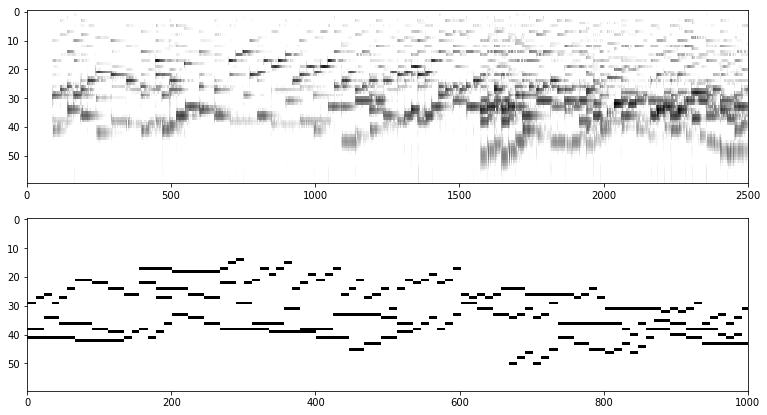

In [9]:
fig, ax = plt.subplots(2,figsize=(14,7))
ax[0].imshow(perf_rep[0:2500].T[::-1][30:90],interpolation='none',cmap='Greys',aspect=2500/250.)
util.plot_events(ax[1],score_events,num_windows=1000)

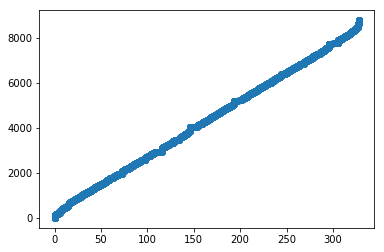

In [10]:
L = align.align(score_rep,perf_rep,weights)
path,costs = align.traceback(score_rep,perf_rep,L,weights)
plt.scatter(*zip(*path))

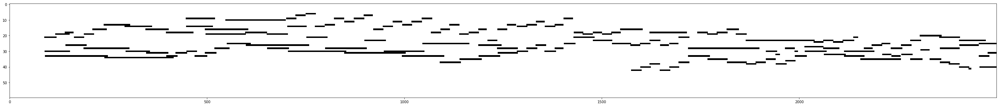

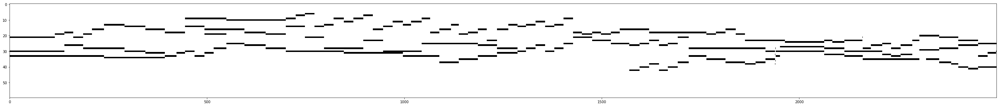

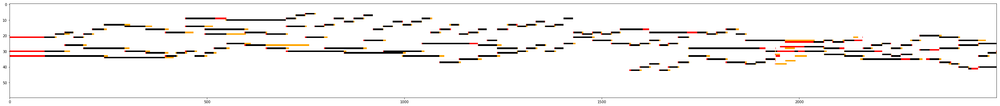

In [11]:
alignment = np.array([np.sum(score_events[:p[0],-1]) for p in path])
util.plot_time_alignment(perf_events, score_events, alignment, num_windows=2500)

In [12]:
aligned_notes = []
for note, onset, offset in score:
    perf_onset = np.argmax(alignment>=onset)
    perf_offset = np.argmax(alignment>=offset)
    aligned_notes.append((note, perf_onset, perf_offset))
    
# synthesize the score with the timings given by the alignment
out = audio.mark_notes(wav, [n[1]*stride for n in aligned_notes], [[n[0]] for n in aligned_notes])

# play it back superimposed on the actual performance
Audio(0.3*out + 0.7*wav.numpy(),rate=fs)